In [119]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

##  Partie 1 : Echelle unique et inhibition

####  Calcul du Gradient avec un Noyau Gaussien

In [120]:
import numpy as np
from scipy.ndimage import convolve

def scale_dependent_gradient(image, sigma):
    # Fonction pour calculer le gradient à dépendance d'échelle
    # Création des noyaux gaussiens dérivés
    Gx, Gy = gaussian_derivative_kernels(sigma)
    
    # Convolution de l'image avec les noyaux dérivés
    F_sigma_x = convolve(image, Gx, mode='nearest')
    F_sigma_y = convolve(image, Gy, mode='nearest')
    
    # Calcul de la magnitude du gradient
    M_sigma = np.sqrt(F_sigma_x**2 + F_sigma_y**2)
    
    # Normalisation
    M_sigma /= np.max(M_sigma)
    
    return M_sigma

def gaussian_derivative_kernels(sigma):
    # Fonction pour créer les noyaux gaussiens dérivés
    # Taille du noyau (un multiple de sigma)
    sz = int(np.ceil(sigma * 3) * 2 + 1)
    
    # Création du noyau gaussien
    X, Y = np.meshgrid(np.arange(-sz/2, sz/2 + 1), np.arange(-sz/2, sz/2 + 1))
    G = np.exp(-(X**2 + Y**2) / (2 * sigma**2)) / (2 * np.pi * sigma**2)
    
    # Dérivées du noyau gaussien
    Gx = -X * G / sigma**2
    Gy = -Y * G / sigma**2
    
    return Gx, Gy


In [121]:
def gradient_magnitude(gray_image, sigma=1.0):
    # Apply Gaussian smoothing
    blurred_image = cv2.GaussianBlur(gray_image, (0, 0), sigmaX=sigma)

    # Compute the x and y gradients using the Sobel operators
    gradient_x = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=3)
    gradient_y = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=3)

    plt.figure(0)
    plt.imshow(gradient_x, cmap='gray')
    plt.title('Gradient X')
    plt.show()
    plt.figure(1)
    plt.imshow(gradient_y, cmap='gray')
    plt.title('Gradient Y')
    plt.show()

    # Compute the gradient magnitude
    gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

    # Normalize to [0, 1]
    gradient_magnitude /= np.max(gradient_magnitude)

    return gradient_magnitude


## filtre de Gabor a combiner avec l'approche canny modifier avec inhibtion  

In [122]:
def create_gaborfilter():
    # This function is designed to produce a set of GaborFilters 
    # an even distribution of theta values equally distributed amongst pi rad / 180 degree
     
    filters = []
    num_filters = 55
    ksize = 15  # The local area to evaluate
    sigma = 1.0  # Larger Values produce more edges
    lambd = 10.0
    gamma = 0.5
    psi = 0  # Offset value - lower generates cleaner results
    for theta in np.arange(0, np.pi, np.pi / num_filters):  # Theta is the orientation for edge detection
        kern = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_64F)
        kern /= 1.0 * kern.sum()  # Brightness normalization
        filters.append(kern)
    return filters


def apply_filter(img, filters):
# This general function is designed to apply filters to our image
     
    # First create a numpy array the same size as our input image
    newimage = np.zeros_like(img)
     
    # Starting with a blank image, we loop through the images and apply our Gabor Filter
    # On each iteration, we take the highest value (super impose), until we have the max value across all filters
    # The final image is returned
    depth = -1 # remain depth same as original image
     
    for kern in filters:  # Loop through the kernels in our GaborFilter
        image_filter = cv2.filter2D(img, depth, kern)  #Apply filter to image
         
        # Using Numpy.maximum to compare our filter and cumulative image, taking the higher value (max)
        np.maximum(newimage, image_filter, newimage)
    return newimage

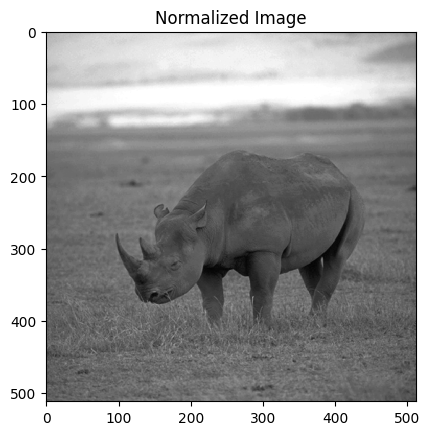

In [123]:
import cv2
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('database/images/rino.pgm', cv2.IMREAD_UNCHANGED)

if image is None:
    print("Error: Unable to read the image.")
else:
    # Convert to float
    image = image.astype(float)

    # Normalize the image values to be between 0 and 1
    image_normalized = (image - image.min()) / (image.max() - image.min())

    # Display the normalized image
    plt.imshow(image_normalized, cmap='gray')
    plt.title('Normalized Image')
    plt.show()


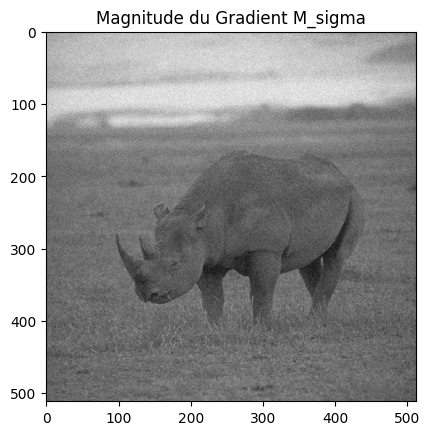

In [124]:
## adding noise to the image 

noise = np.random.normal(0, 1, image_normalized.shape)
image_noisy = (1-0.05)*image_normalized + 0.05*noise

plt.imshow(image_noisy, cmap='gray')
plt.title('Magnitude du Gradient M_sigma')
plt.show()

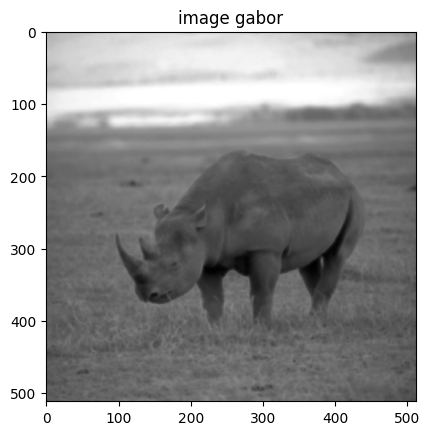

In [125]:
# We create our gabor filters, and then apply them to our image
gfilters = create_gaborfilter()
image_g = apply_filter(image_normalized, gfilters)
 
# Afficher le gradient
plt.imshow(image_g, cmap='gray')
plt.title('image gabor')
plt.show()

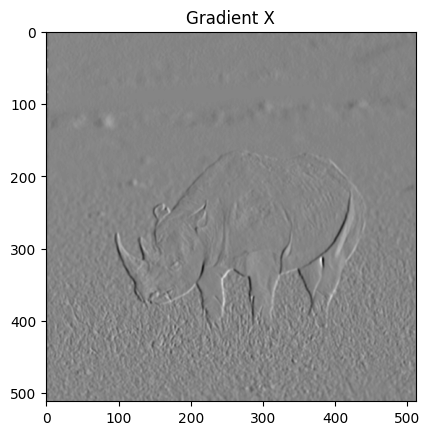

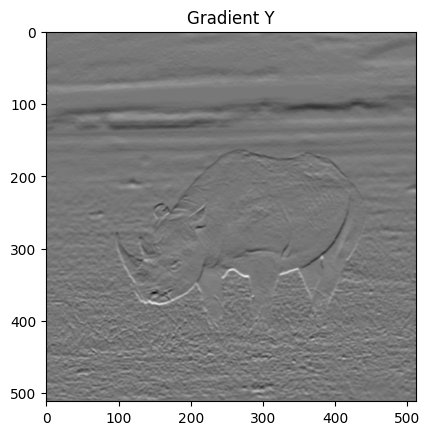

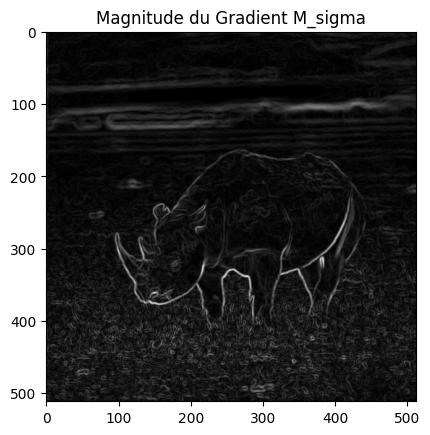

In [126]:
# Partie 1 : Echelle unique et inhibition
# Calcul du Gradient avec un Noyau Gaussien
# paramètre
sigma = 1

M_sigma = gradient_magnitude(image_normalized, sigma)

# Afficher le gradient
plt.imshow(M_sigma, cmap='gray')
plt.title('Magnitude du Gradient M_sigma')
plt.show()


#### Inhibition des Contours Environnants

In [127]:
def difference_of_gaussians(sigma):
    # Taille du noyau (un multiple de sigma)
    sz = int(np.ceil(sigma * 3) * 2 + 1)
    
    # Création de la grille de coordonnées
    X, Y = np.meshgrid(np.arange(-sz/2, sz/2 + 1), np.arange(-sz/2, sz/2 + 1))
    
    # Calcul des deux gaussiennes
    G1 = np.exp(-(X**2 + Y**2) / (2 * (sigma * 4)**2))
    G2 = np.exp(-(X**2 + Y**2) / (2 * sigma**2))
    
    # Difference of Gaussians
    dog = np.maximum(G1 / (2 * np.pi * (sigma * 4)**2) - G2 / (2 * np.pi * sigma**2), 0)
    
    return dog

def normalization_term(sigma):
    # Calcul du DoG
    dog = difference_of_gaussians(sigma)
    
    # Calcul du terme de normalisation
    w_sigma = dog / np.sum(dog**2)
    
    return w_sigma

def suppression_term(M_sigma, sigma):
    # Calcul du DoG
    w_sigma = normalization_term(sigma)
    
    # Convolution du DoG avec la magnitude du gradient
    t_sigma = convolve(M_sigma, w_sigma, mode='nearest')
    
    return t_sigma

def contour_inhibition(M_sigma, sigma, alpha):
    # Calcul du terme de suppression
    t_sigma = suppression_term(M_sigma, sigma)
    
    # Supprimer les valeurs négatives
    t_sigma = np.maximum(t_sigma, 0)
    
    # Inhibition de contour
    c_sigma = M_sigma - alpha * t_sigma
    
    # Supprimer les valeurs négatives
    c_sigma = np.maximum(c_sigma, 0)
    
    return c_sigma


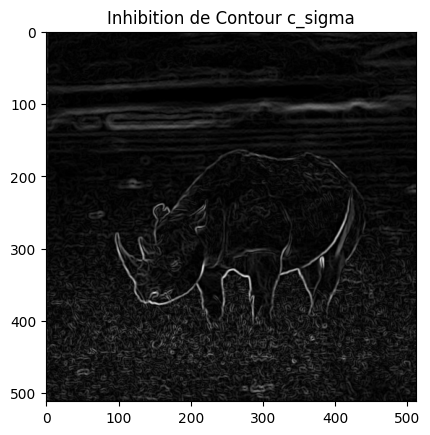

In [128]:
# paramètre
alpha = 0.001



c_sigma = contour_inhibition(M_sigma  , sigma , alpha)


# Afficher l'inhibition
plt.imshow(c_sigma, cmap='gray')
plt.title('Inhibition de Contour c_sigma')
plt.show()

In [129]:
## binaristion of c_sigma
c_sigma 

array([[0.        , 0.11050758, 0.10666669, ..., 0.04729595, 0.04224809,
        0.        ],
       [0.01599152, 0.11461632, 0.11169843, ..., 0.05286092, 0.05648055,
        0.04710349],
       [0.04478314, 0.12862596, 0.12825995, ..., 0.06534782, 0.07111565,
        0.07329088],
       ...,
       [0.21042127, 0.21518737, 0.21348966, ..., 0.01074501, 0.00642744,
        0.        ],
       [0.08683454, 0.10181085, 0.10791963, ..., 0.01981725, 0.01146364,
        0.00676584],
       [0.        , 0.03407056, 0.02319479, ..., 0.00882902, 0.        ,
        0.        ]])

## Methode Rosin

In [130]:
import numpy as np
from scipy.ndimage import gaussian_filter1d
import numpy as np
import cv2
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter

def doubleRosinThr(originalImage, precission=0.01, gaussianSigma=1):
    # Validate Arguments
   
    assert (precission > 0), 'Error: Precision must be a positive value.'

    binsNumber = round(1 / precission)
    assert (binsNumber > 10), 'Error: Wrong (too coarse) precision.'

    assert (gaussianSigma >= 0), 'Error: GaussianSigma must be a non-negative value.'

    # Preprocessing
    originalImage = originalImage.astype(np.float64)
    if np.max(originalImage) > 1.001:
        factor = 255
        originalImage = originalImage / 255
    else:
        factor = 1

 

    # Histogram Processing
    histogram, _ = np.histogram(originalImage.flatten(), bins=binsNumber, range=[0, 1])
    if gaussianSigma == float('inf'):
        print(histogram.shape)
        poss, _ = find_peaks(np.concatenate(([0], histogram)))
        while len(poss) > 1:
            histogram = gaussian_filter(histogram, sigma=1.0)
            print(histogram.shape)
            poss, _ = find_peaks(np.concatenate(([0], histogram)))
    elif gaussianSigma > 0:
        histogram = gaussian_filter(histogram, sigma=gaussianSigma)

    # Finding the Peak
    histPeakVal, _ = find_peaks(histogram)
    if histPeakVal.size == 0:
        histPeak = np.argmax(histogram)
    elif len(histPeakVal) == 1:
        histPeak = histPeakVal[0]
        if histogram[histPeak] < 0.10 * histogram[0]:
            histPeak = np.argmax(histogram)
    elif len(histPeakVal) > 1:
        peak_vals = histogram[histPeakVal]
        max_val = peak_vals.max()
        histPeak = histPeakVal[peak_vals == max_val][0]
        if np.sum(histogram[histPeak:]) < 0.10 * np.sum(histogram) or histogram[histPeak] < 0.33 * histogram.max():
            histPeak = np.argmax(histogram)

    # Finding the Max
    histEnd = binsNumber - 1
    while histogram[histEnd] == 0 and histogram[histEnd - 1] == 0 and histEnd > 1:
        histEnd -= 1

    if histEnd == 1:
        raise ValueError('Error: The histogram was empty or the image was 0-valued.')

    # Processing: Finding the high THR
    highThr = histPeak + getMaxDist(histogram[histPeak:histEnd]) - 1

    # Processing: Finding the low THR
    lowThr = histPeak + getMaxDist(histogram[histPeak:highThr]) - 1



    ## plot the treshold on the histogramm plot 
    # Assuming histogram is the input histogram and highThr, lowThr are the threshold values
    plt.plot(histogram, color='gray')
    plt.axvline(x=highThr, color='r', linestyle='--', label='High Threshold')
    plt.axvline(x=lowThr, color='g', linestyle='--', label='Low Threshold')
    plt.legend()
    plt.show()

    
        # Output formatting
    perc = np.array([lowThr, highThr]) / binsNumber
    doubleThr = perc * factor

    return doubleThr


def getMaxDist(funcValues):
    x = 0
    y = len(funcValues) - 1

    hx = funcValues[x]
    hy = funcValues[y]

    # Checking if the denominator is zero to avoid division by zero
    if y - x == 0:
        return x

    # Defining the line
    a = (hy - hx) / (y - x)
    b = hx - (x * a)

    distances = np.zeros_like(funcValues)
    maxDistance = -1
    furthersPos = x

    for z in range(x, y + 1):
        hz = funcValues[z]
        dist = np.abs(a * z - hz + b) / np.sqrt(a ** 2 + 1)
        distances[z] = dist
        if dist > maxDistance:
            maxDistance = dist
            furthersPos = z

    return furthersPos


#### Seuillage par hystérésie et suppression des non-maxima

In [131]:
def get_neighbors(grad_angle, i, j):
    # Determine the neighbors based on the gradient angle

    # Convert angle to degrees
    angle1 = grad_angle * 180.0 / np.pi

    # Make sure the angle is positive
    angle1 = angle1 % 180

    # Quantize the angle to one of four directions: 0, 45, 90, 135 degrees
    quantized_angle = (round(angle1 / 45) * 45) % 180

    # Determine neighboring pixels based on the quantized angle
    if quantized_angle == 0:
        neighbors = [(i, j - 1), (i, j + 1)]
    elif quantized_angle == 45:
        neighbors = [(i - 1, j - 1), (i + 1, j + 1)]
    elif quantized_angle == 90:
        neighbors = [(i - 1, j), (i + 1, j)]
    elif quantized_angle == 135:
        neighbors = [(i - 1, j + 1), (i + 1, j - 1)]
    else:
        raise ValueError("Invalid quantized angle")

    return neighbors[0], neighbors[1]

In [132]:
from skimage import img_as_float

def find_neighbors(angle, i, j):
    neighb1 = (i, j)
    neighb2 = (i, j)
    # Détermination de la direction du gradient
    if (angle > -np.pi/8 and angle <= np.pi/8) or (angle > 7*np.pi/8 or angle <= -7*np.pi/8):
        neighb1 = (i, j+1); neighb2 = (i, j-1)

    elif (angle > np.pi/8 and angle <= 3*np.pi/8) or (angle > -7*np.pi/8 and angle <= -5*np.pi/8):
        neighb1 = (i-1, j+1); neighb2 = (i+1, j-1)
    elif (angle > 3*np.pi/8 and angle <= 5*np.pi/8) or (angle > -5*np.pi/8 and angle <= -3*np.pi/8):
        neighb1 = (i-1, j); neighb2 = (i+1, j)
    elif (angle > 5*np.pi/8 and angle <= 7*np.pi/8) or (angle > -3*np.pi/8 and angle <= -np.pi/8):
        neighb1 = (i-1, j-1); neighb2 = (i+1, j+1)
    
    return neighb1, neighb2

def supp_non_max(c_sigma):
    # Calcul du gradient
    Fx, Fy = np.gradient(img_as_float(c_sigma))
    plt.imshow(np.arctan2(Fy,Fx),cmap='gray')
    plt.title('arctan(Iy/Ix)')
    plt.show()
    angle =  np.pi/2 - np.arctan2(Fy, Fx)
    

    # Suppression des non-maximas
    non_max_suppressed = np.zeros_like(c_sigma)
    for i in range(0, angle.shape[0]-1):
        for j in range(0, angle.shape[1]-1):
            
            if  (angle[i,j] >= 3.14) :
                angle[i,j] = angle[i,j] - np.pi

            


            # Trouver les voisins dans la direction du gradient
            neighb1, neighb2 = get_neighbors(angle[i, j], i, j)
            
            # Suppression des non-maxima
            if c_sigma[i, j] >= c_sigma[neighb1] and c_sigma[i, j] >= c_sigma[neighb2]:
                non_max_suppressed[i, j] = c_sigma[i, j]

    seuils = doubleRosinThr(non_max_suppressed,0.01 , 6)            
    
    return non_max_suppressed , seuils

def seuil_hyst(c_sigma):
    # Suppression des non-maximas
    non_max_suppressed  ,s = supp_non_max(c_sigma)

    seuil_bas = s[0]
    seuil_haut = s[1]
    
    b_sigma = np.zeros_like(c_sigma)
    b_sigma[non_max_suppressed >= seuil_haut] = 1
    
    # Propagation des pixels forts aux faibles
    for i in range(1, c_sigma.shape[0]-1):
        for j in range(1, c_sigma.shape[1]-1):
            if non_max_suppressed[i, j] >= seuil_bas:
                if np.any(b_sigma[i-1:i+2, j-1:j+2] == 1):
                    b_sigma[i, j] = 1
   

    
    return b_sigma 

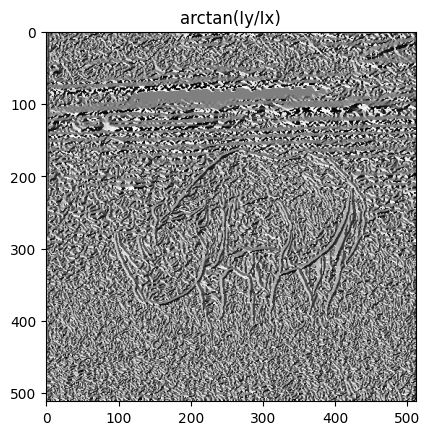

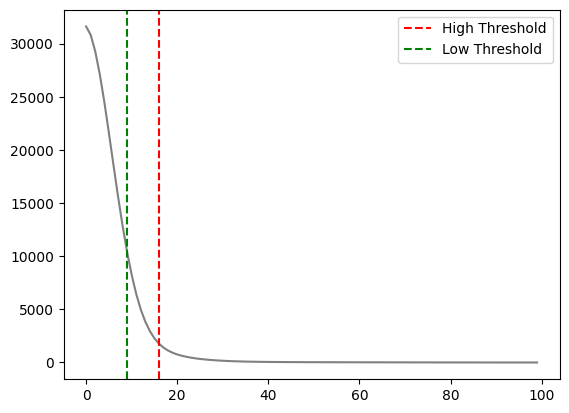

array([0.09, 0.16])

In [133]:
non_max ,s = supp_non_max(c_sigma)


s

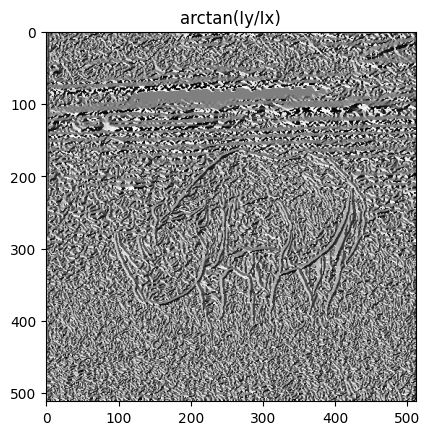

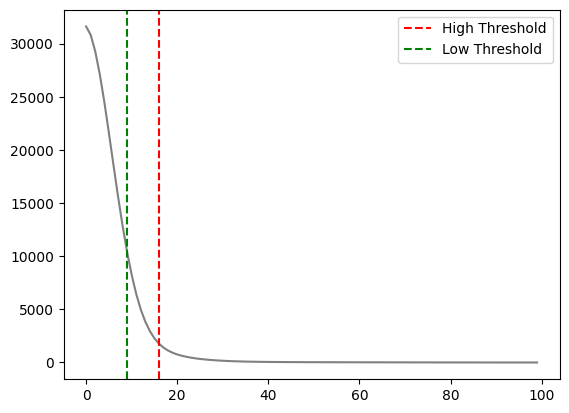

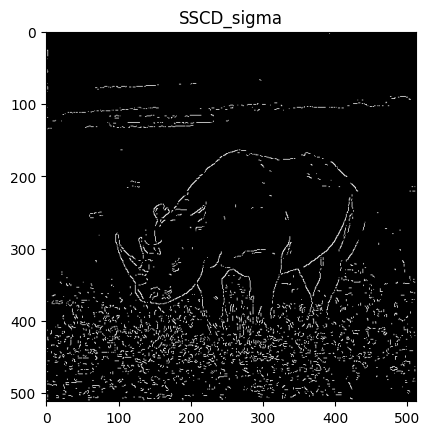

In [134]:

c_sigma2 = seuil_hyst(c_sigma)



# Afficher le résultat final
plt.imshow(c_sigma2, cmap='gray')
plt.title('SSCD_sigma')
plt.show()



## Partie 2 : Echelle multiple et Canny

In [135]:
def SingleScaleContourDetector(image , sigma , alpha):
    # Calcul du Gradient avec un Noyau Gaussien
    M_sigma = gradient_magnitude(image, sigma)
    # Afficher le résultat final
   
    c_sigma = contour_inhibition(M_sigma, sigma, alpha)
    

    ## normalise image 
    
    c_sigma_normal = (c_sigma- c_sigma.min()) / (c_sigma.max() - c_sigma.min())
    # Seuillage hystérésique et suppression des non-maxima
    # Afficher le résultat final
    c_non_max  = supp_non_max(c_sigma)
    
    print('--------')
    print(s[0]
          )
    print(s[1])
    
    SSCD = seuil_hyst(c_sigma_normal)
    
    return SSCD

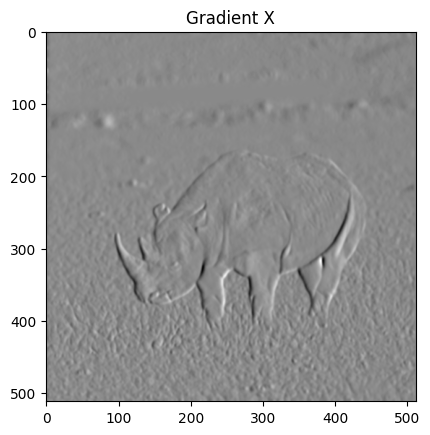

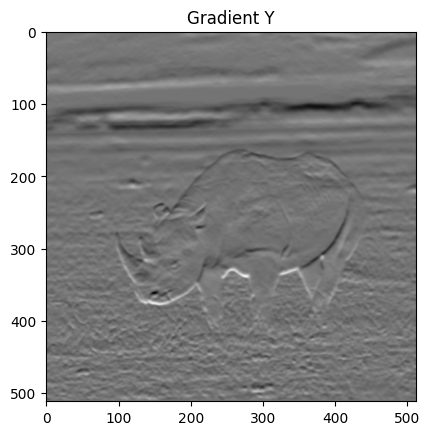

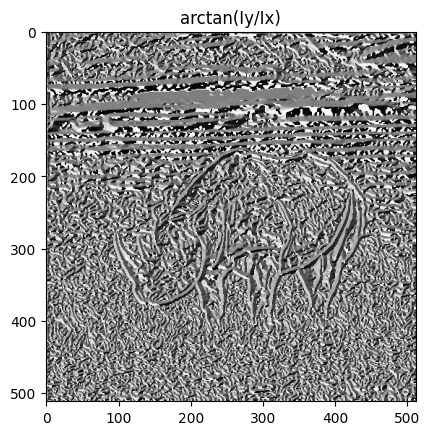

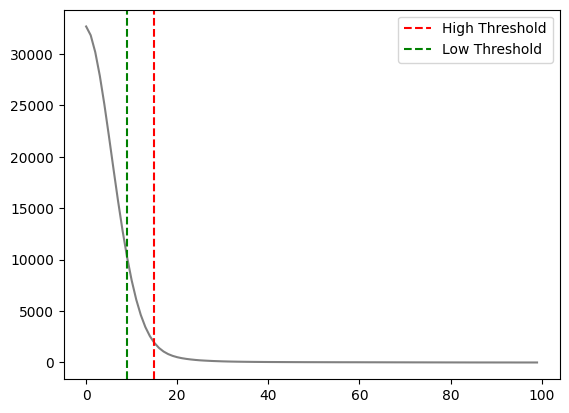

--------
0.09
0.16


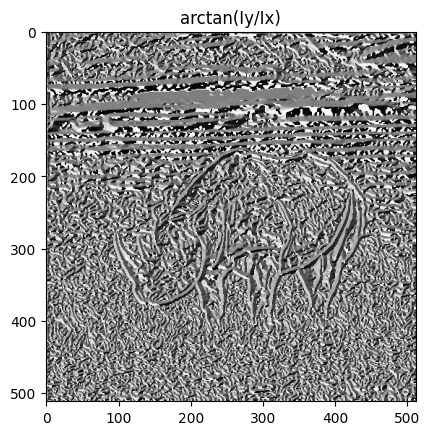

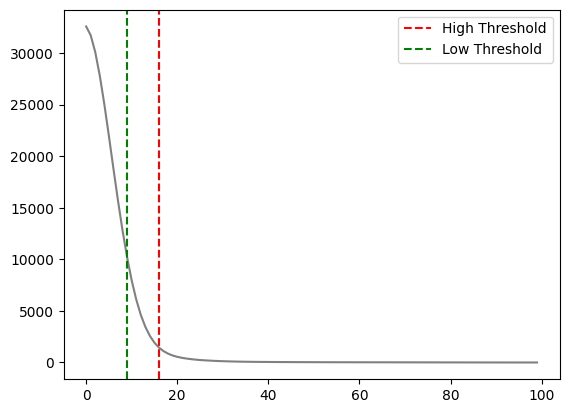

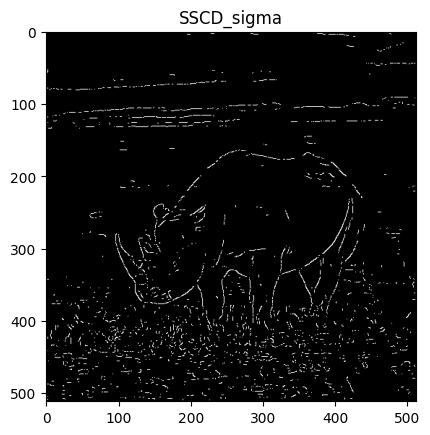

In [136]:
# Canny edge detection for sigma = 1
b1 = SingleScaleContourDetector(image_g , 1 ,alpha)

# Afficher le résultat final
plt.imshow(b1, cmap='gray')
plt.title('SSCD_sigma')
plt.show()

In [137]:
def dilat_morph(image):
    # Opérateur DTO
    rows, cols = np.where(image > 0)
    beta = np.zeros((image.shape[0] * 2, image.shape[1] * 2))
    beta[rows * 2, cols * 2] = 1
    
    # Dilatation morphologique
    se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4, 4))
    dto = cv2.dilate(beta, se)
    return dto

In [138]:
import numpy as np
from scipy.ndimage import binary_dilation
from skimage.morphology import disk

def doubling_and_ticking_operator(binary_map):
    """
    Apply the Doubling and Ticking Operator (DTO) to a binary map.

    Parameters:
    - binary_map: A 2D numpy array representing the binary map.

    Returns:
    - dto_result: The result of applying the DTO to the binary map.
    """

    # Step 1: Doubling - create a new binary map with doubled coordinates for nonzero pixels
    doubled_map = np.zeros((binary_map.shape[0] * 2, binary_map.shape[1] * 2), dtype=np.uint8)
    doubled_map[::2, ::2] = binary_map

    print(doubled_map)

    # Step 2: Ticking - substitute each nonzero pixel in the doubled map with a disk of radius 3 pixels
    structuring_element = disk(3)  # Create a disk structuring element with radius 3
    dto_result = binary_dilation(doubled_map, structure=structuring_element).astype(np.uint8)

    return dto_result


In [139]:
def decim_im(image, N):
    im_decimee = cv2.resize(image, None, fx=1/2**(N-1), fy=1/2**(N-1), interpolation=cv2.INTER_CUBIC).astype(np.float32)
    return im_decimee

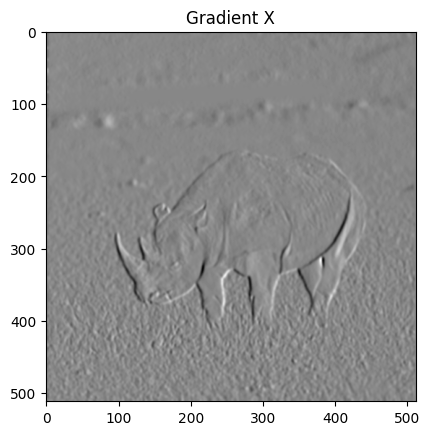

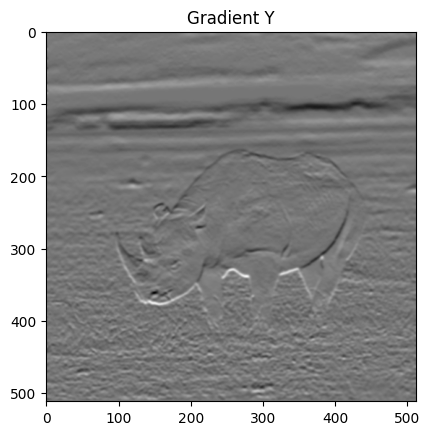

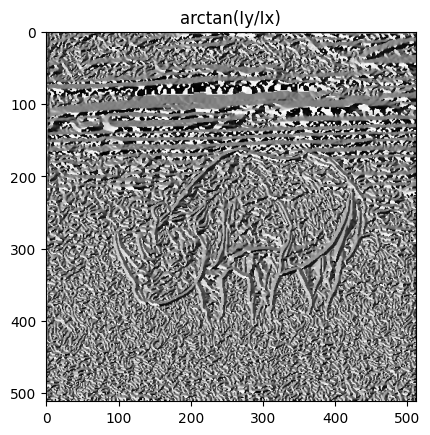

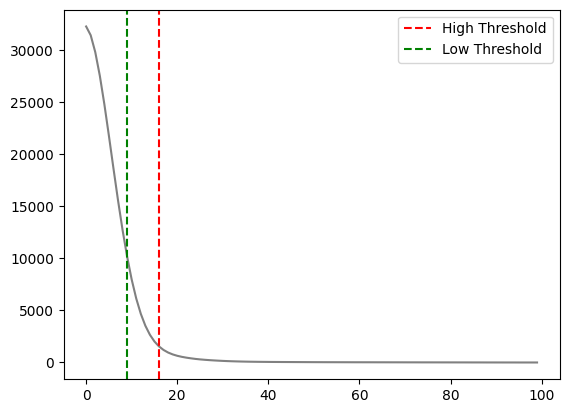

--------
0.09
0.16


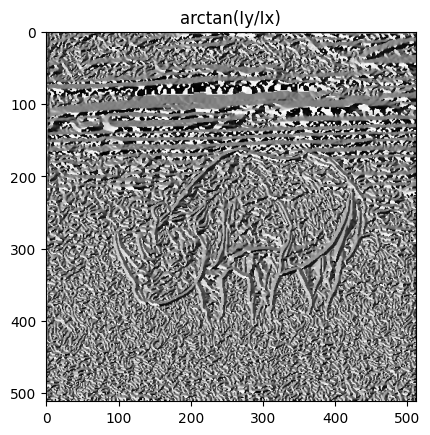

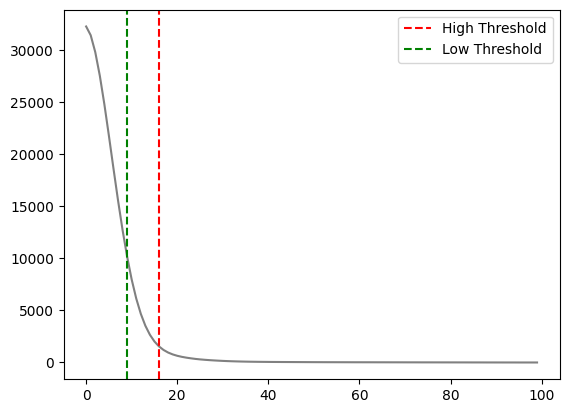

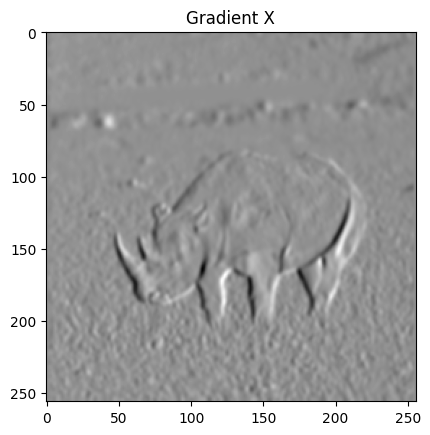

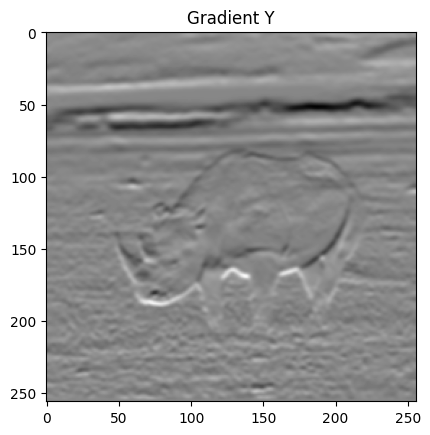

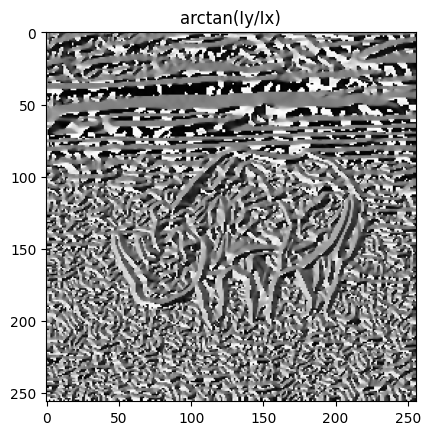

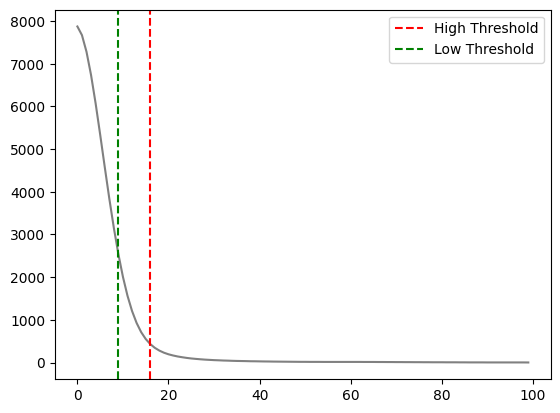

--------
0.09
0.16


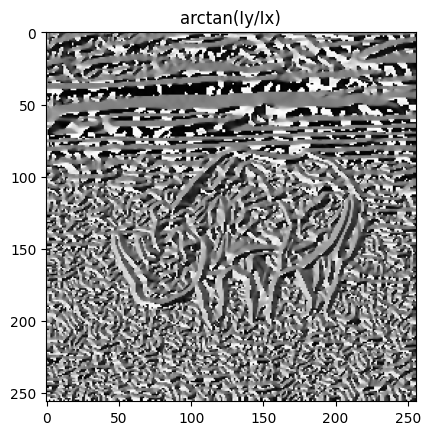

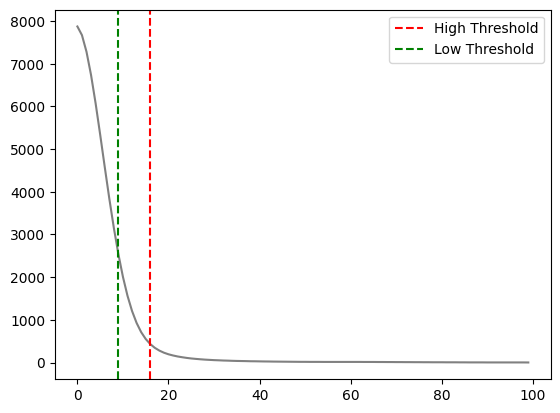

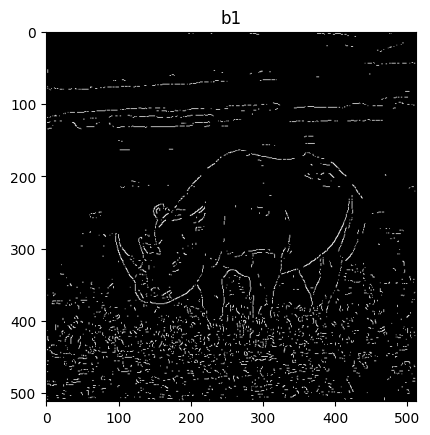

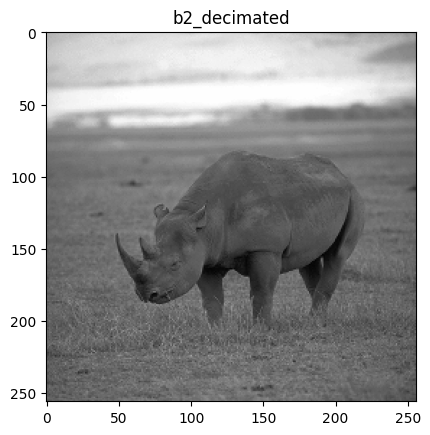

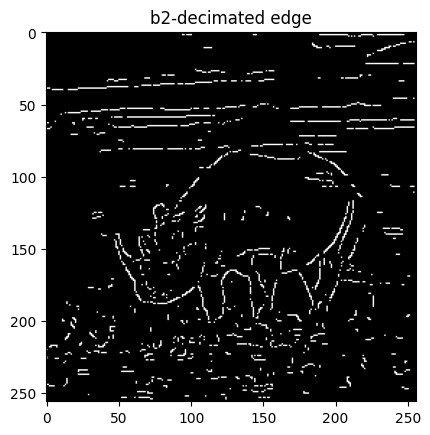

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


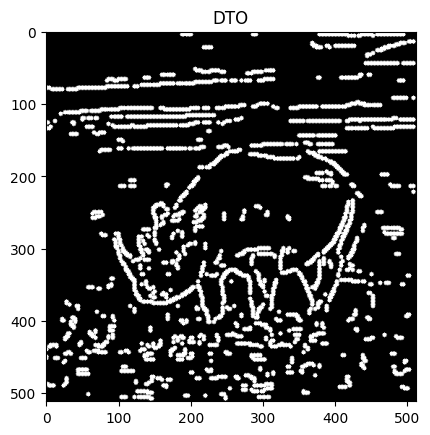

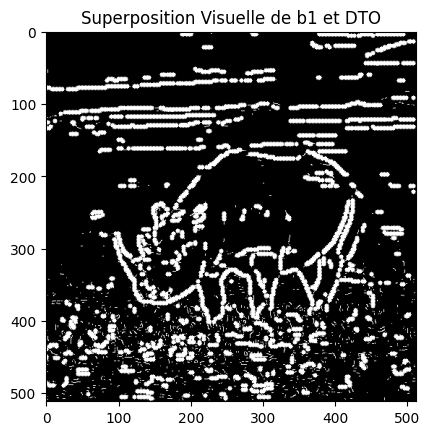

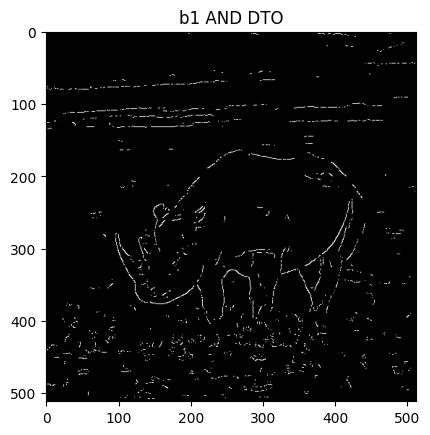

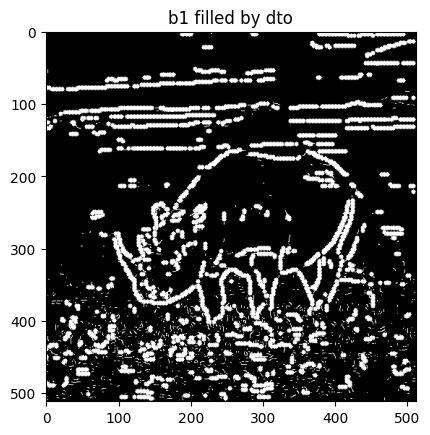

In [140]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Détection des Contours à l'Échelle Originale avec Canny sigma = 1 et 2
# Seuils à ajuster en fonction de l'image qu'on met en entrée

alpha = 0.00000000000000000000009

# Canny edge detection for sigma = 1
b1 = SingleScaleContourDetector(image_normalized, 1.5 ,  alpha)
# Canny edge detection for sigma = 2
k = 2
b2_decimated = decim_im(image_normalized, k)

b2 = SingleScaleContourDetector(b2_decimated, 1.3 , alpha )

# Afficher les résultats
plt.imshow(b1, cmap='gray')
plt.title('b1')
plt.show()


plt.imshow(b2_decimated , cmap='gray')
plt.title('b2_decimated')
plt.show()


plt.imshow(b2 , cmap='gray')
plt.title('b2-decimated edge')
plt.show()

dto2 =doubling_and_ticking_operator(b2)

# Affichage du DTO
plt.imshow(dto2, cmap='gray')
plt.title('DTO')
plt.show()



# Convert b1 to the same data type as dto
b1 = b1.astype(np.uint8)

# Superposition visuelle de b1 et DTO
superposition_visuelle = cv2.bitwise_or(b1 , dto2)

plt.imshow(superposition_visuelle, cmap='gray')
plt.title('Superposition Visuelle de b1 et DTO')
plt.show()

# Opération logique AND entre b1 et DTO
b1_and_dto = cv2.bitwise_and(b1, dto2)
combined_image = np.where(b1 == 0, dto2, b1)

plt.imshow(b1_and_dto, cmap='gray')
plt.title('b1 AND DTO')
plt.show()

plt.imshow(combined_image, cmap='gray')
plt.title('b1 filled by dto')
plt.show()


In [141]:
dto2

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

##  Partie 3 : Echelle multiple et inhibition

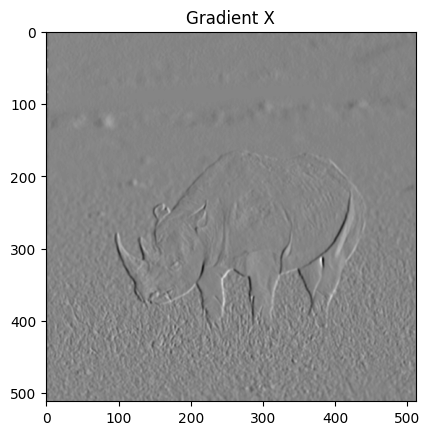

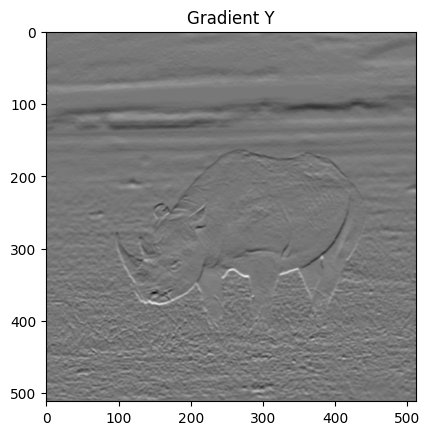

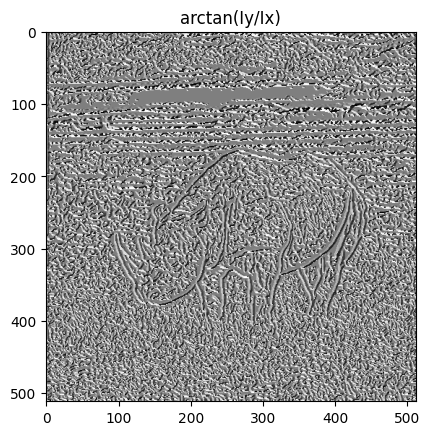

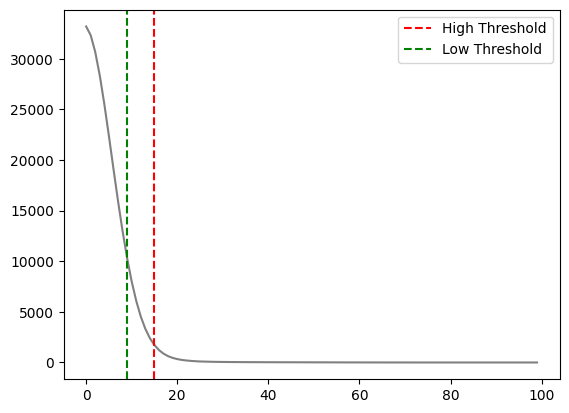

--------
0.09
0.16


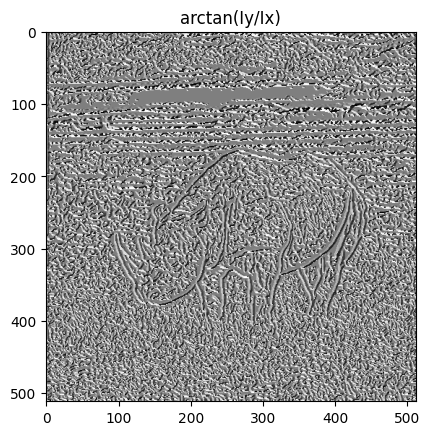

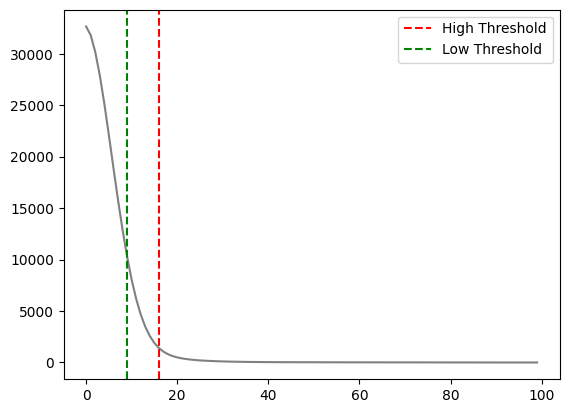

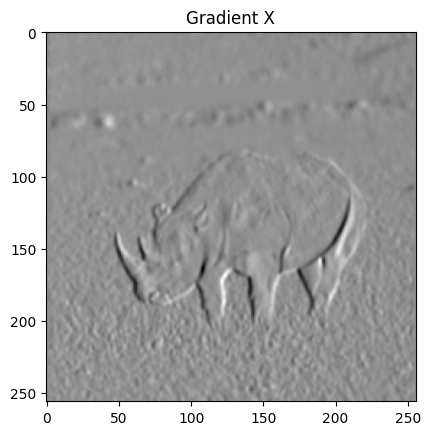

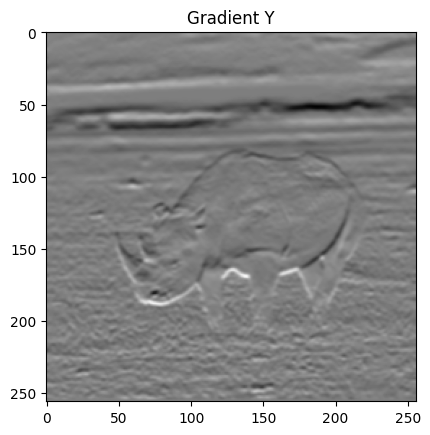

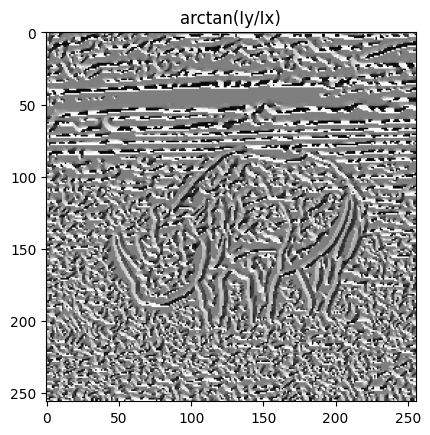

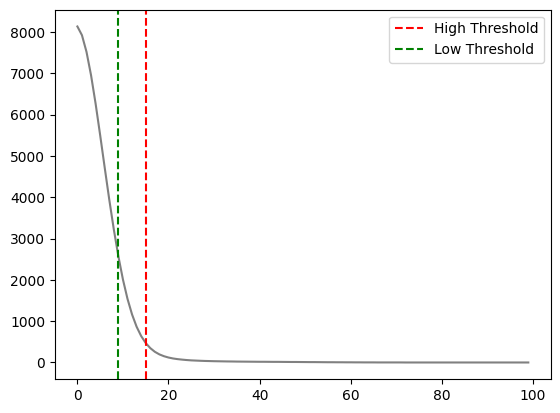

--------
0.09
0.16


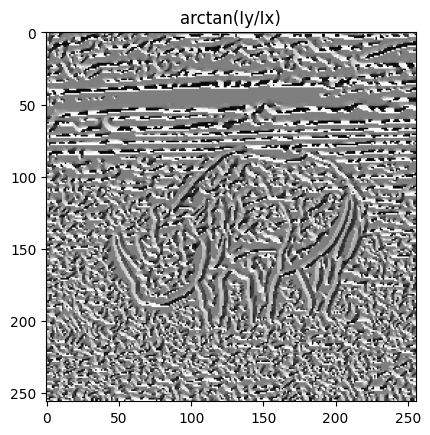

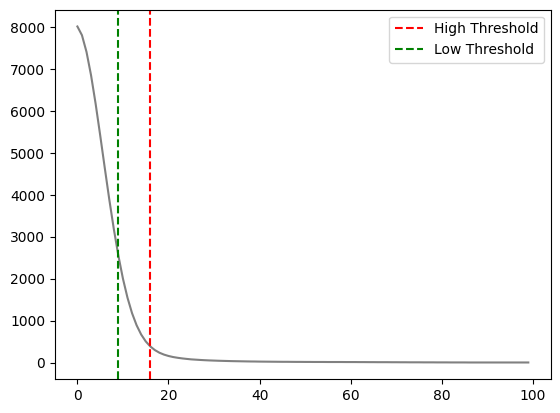

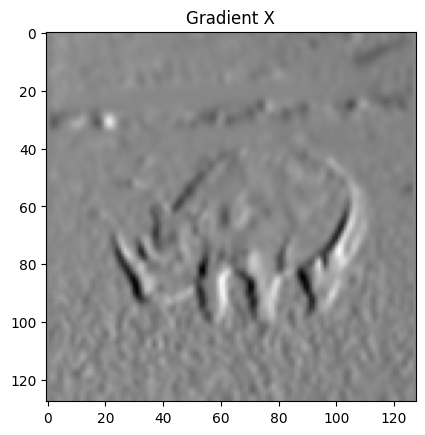

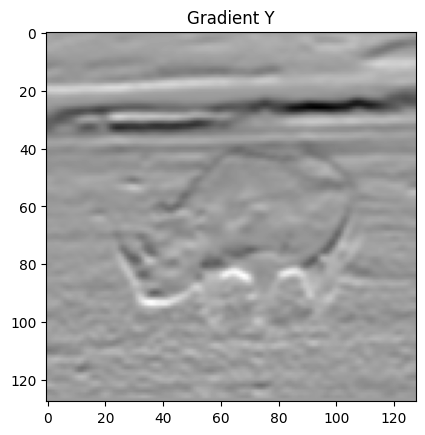

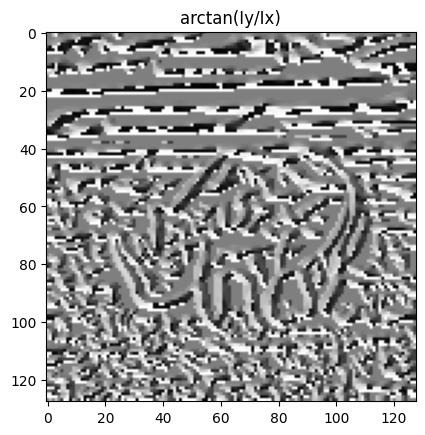

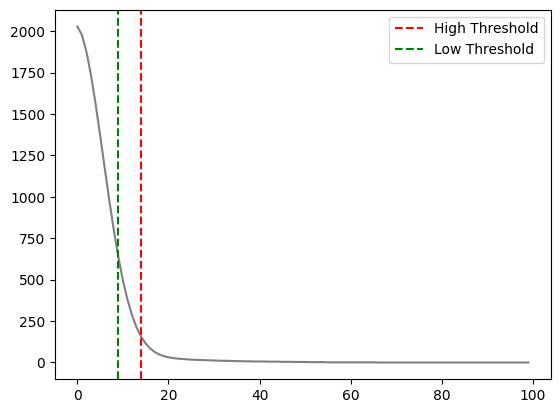

--------
0.09
0.16


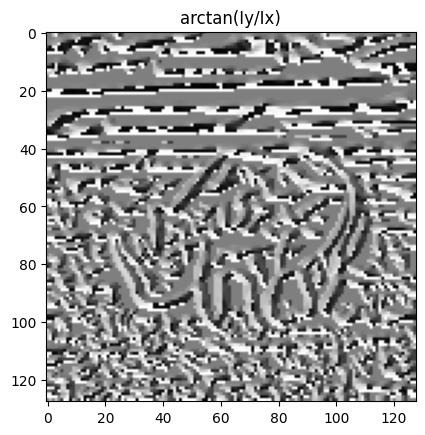

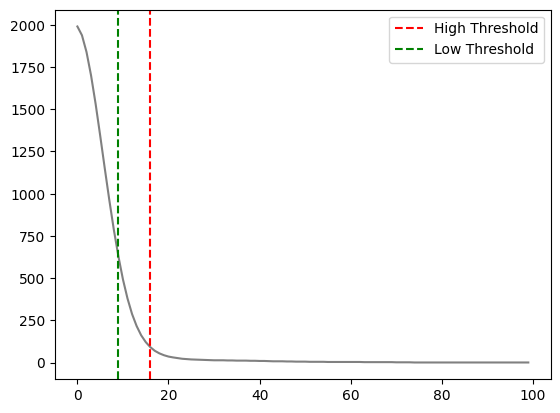

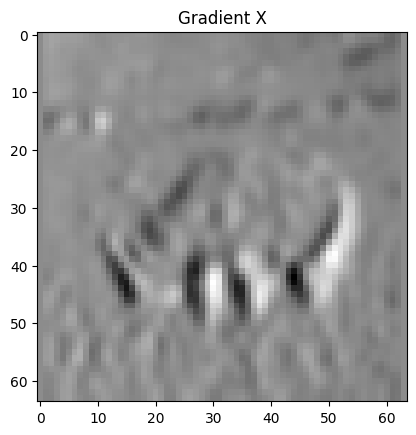

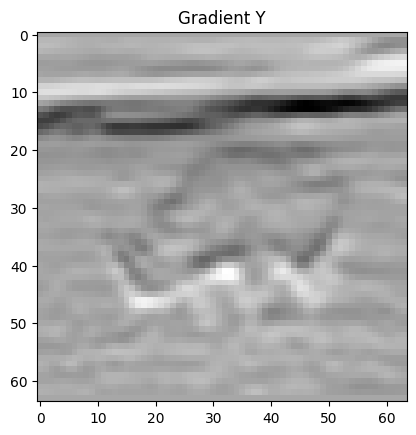

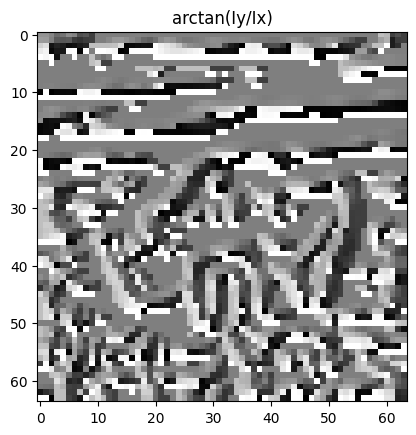

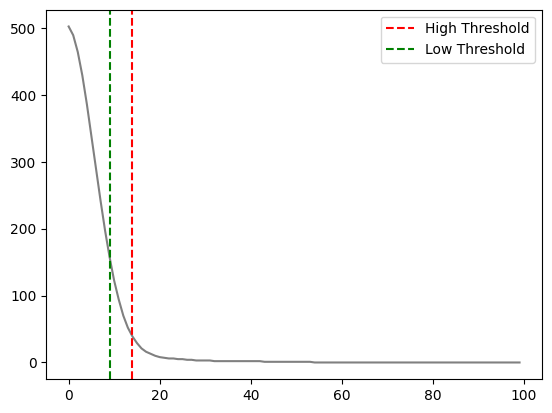

--------
0.09
0.16


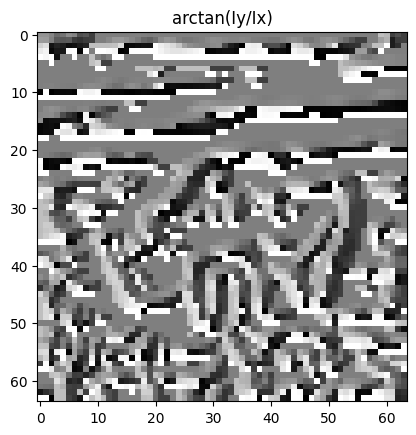

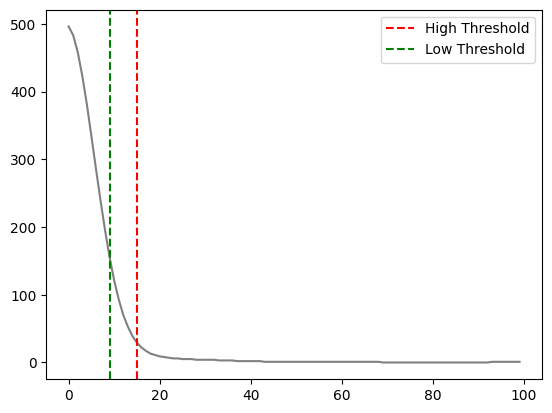

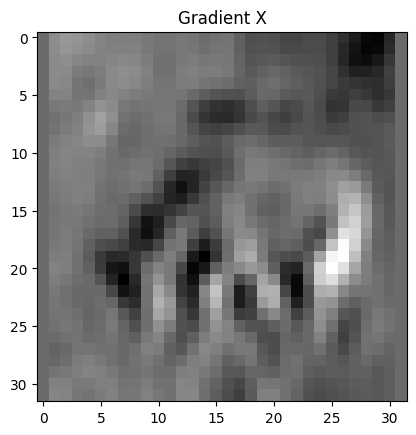

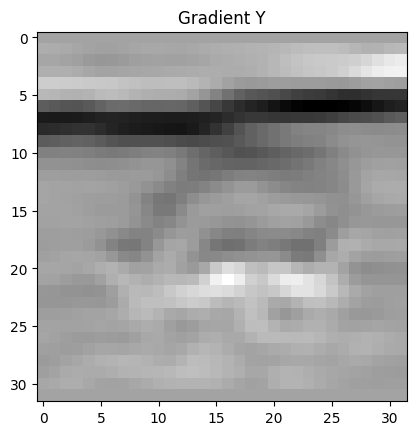

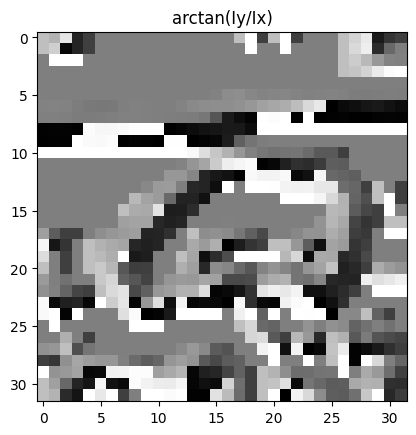

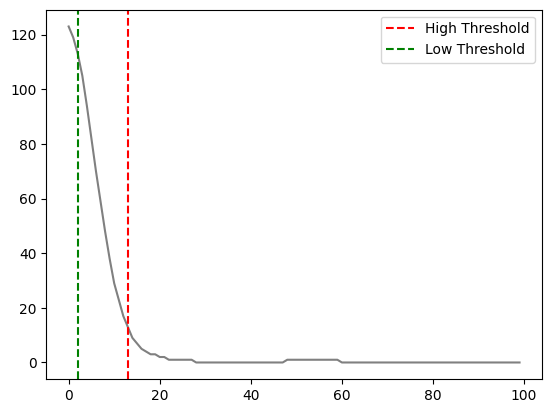

--------
0.09
0.16


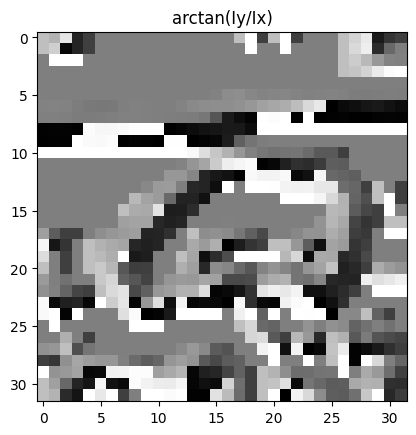

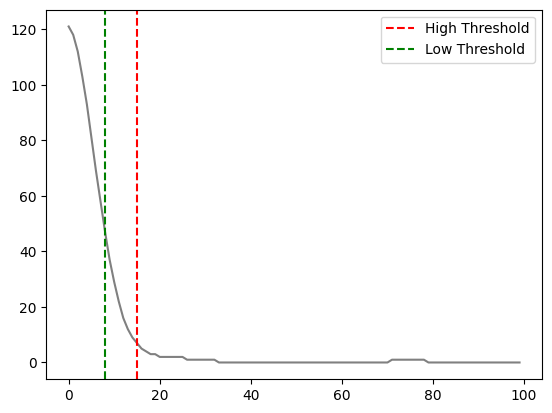

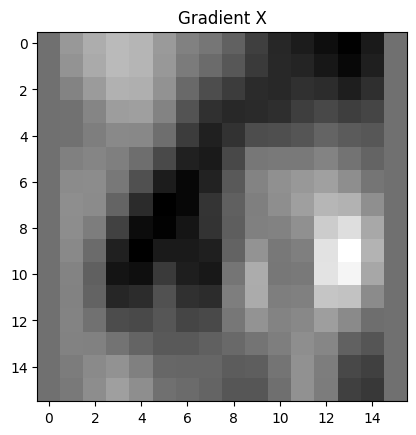

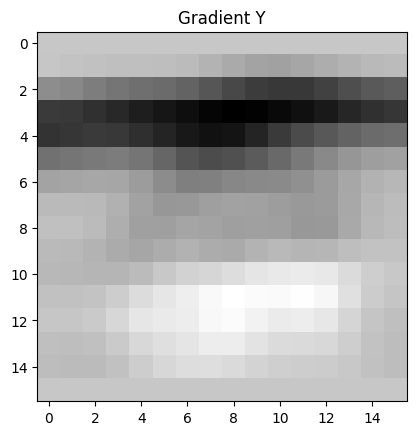

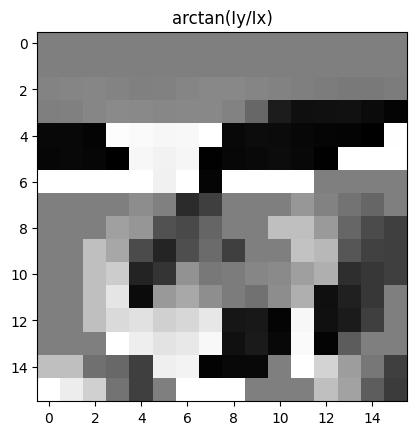

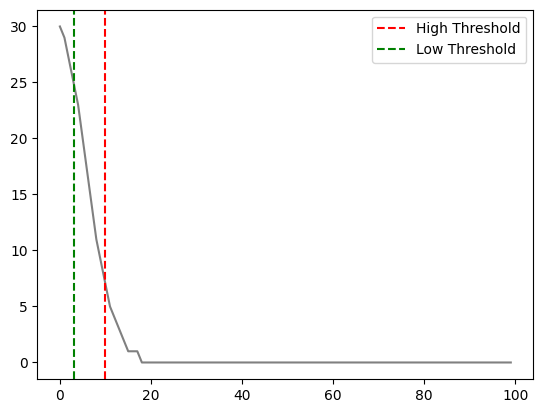

--------
0.09
0.16


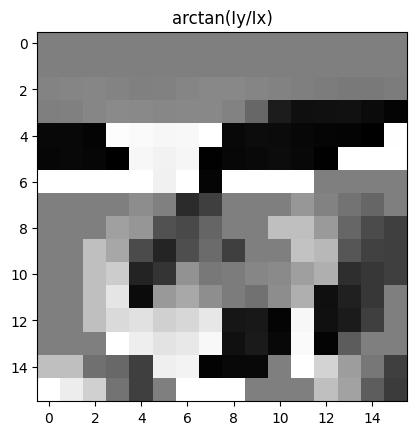

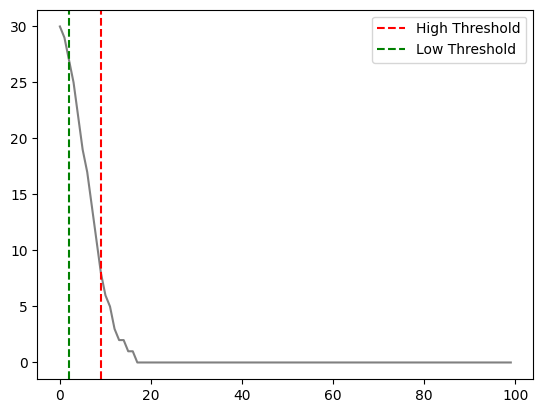

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


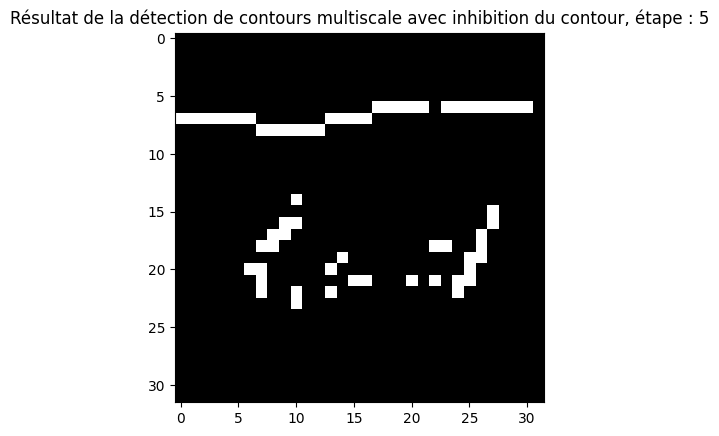

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


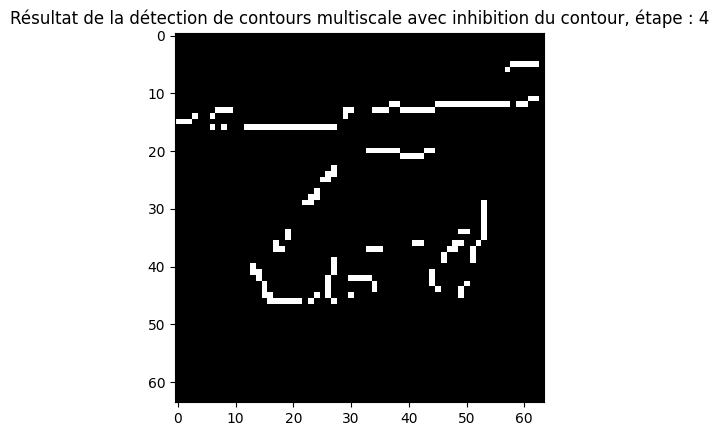

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


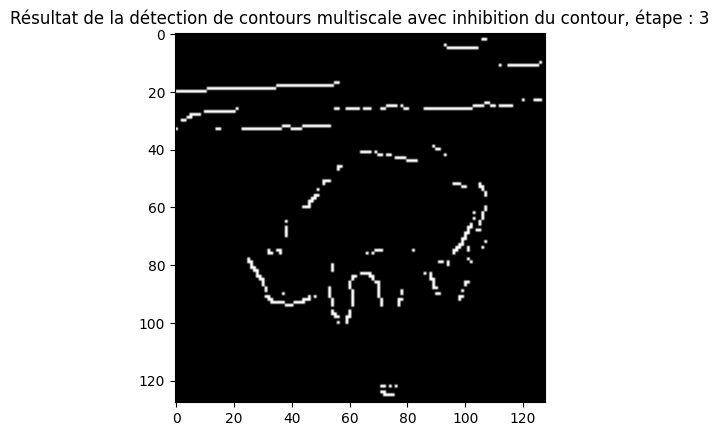

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


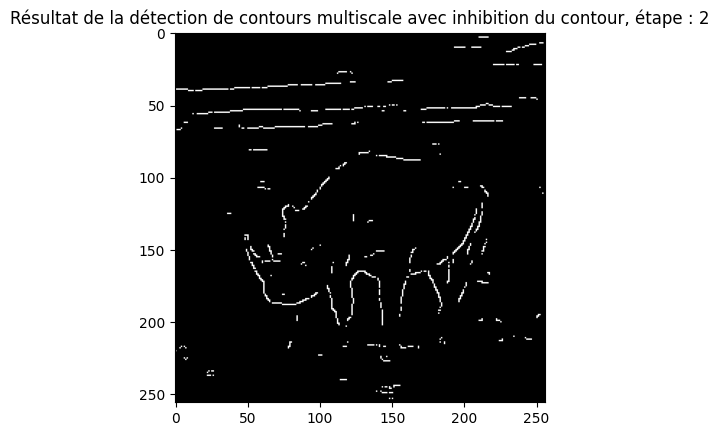

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


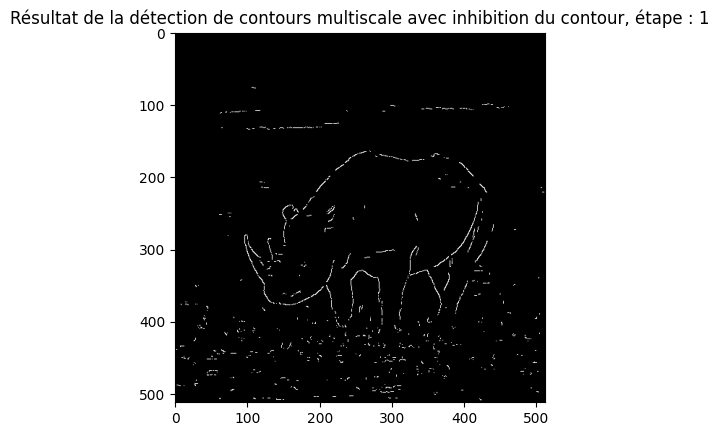

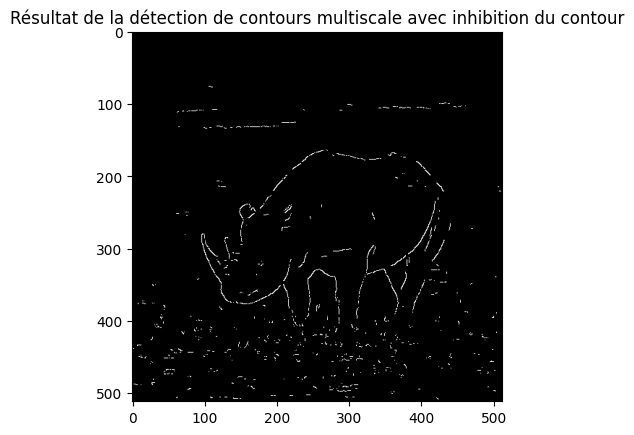

In [142]:
# Paramètres
N = 6  # Nombre d'échelles
alpha =0.005

# Tableau de matrices et calcul des images à plusieurs échelles
images_decimees = [None] * N
images_decimees[0] = image_normalized

for n in range(2, N + 1):
    images_decimees[n-1] = decim_im(image_normalized,  n)


# Détection de contours à chaque échelle
contours_binaires = [None] * N

for n in range(N):
    contours_binaires[n] = SingleScaleContourDetector(images_decimees[n] , 1  , alpha)

# Combine les contours à différentes échelles : de la plus grossière et en descendant progressivement
resultat_final = contours_binaires[N-1]

for n in range(N-2, -1, -1):
    # Dilatation du résultat actuel
    dto = doubling_and_ticking_operator(contours_binaires[n+1])
    
    # Convert b1 to the same data type as dto
    contours_binaires[n] = contours_binaires[n].astype(np.uint8)

   

    # Combinaison avec la carte de contours à l'échelle suivante
    resultat_final = cv2.bitwise_and(contours_binaires[n], dto)
    ##resultat_final = np.where(contours_binaires[n] == 0, dto, contours_binaires[n])
    plt.imshow(resultat_final, cmap='gray')
    plt.title('Résultat de la détection de contours multiscale avec inhibition du contour, étape : ' + str(n+1))
    plt.show()

plt.imshow(resultat_final, cmap='gray')
plt.title('Résultat de la détection de contours multiscale avec inhibition du contour')
plt.show()

In [143]:
## testing of cv2.bitwise_and
import cv2
import numpy as np
import matplotlib.pyplot as plt

im1 = np.array([[0,0,0,0,0],[0,0,0,0,0],[0,0,1,0,0],[0,0,0,0,0],[0,0,0,0,0]])
im2 = np.array([[0,1,0],[0,1,0],[0,1,0]])


im1


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]])

-------------------------------
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 1 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


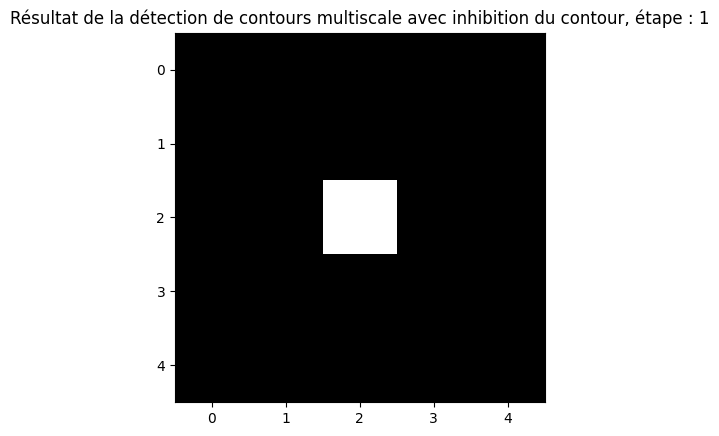

-------------------------------
[[0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]
-------------------------------
[[0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 0 0 0]
 [0 1 1 1 1 1 1 1 0 0]
 [0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]
-------------------------------
-------------------------------


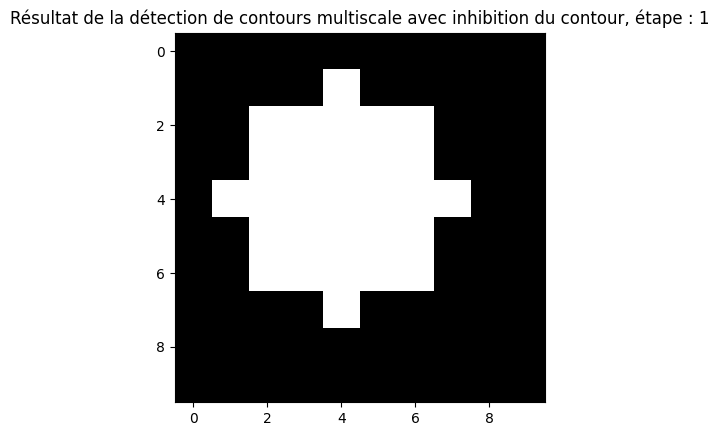

-------------------------------


In [144]:
print('-------------------------------')
print(im1)
plt.imshow(im1, cmap='gray')
plt.title('Résultat de la détection de contours multiscale avec inhibition du contour, étape : ' + str(n+1))
plt.show()

print('-------------------------------')


imd = doubling_and_ticking_operator(im1)


print('-------------------------------')
print(imd)
print('-------------------------------')


print('-------------------------------')
plt.imshow(imd, cmap='gray')
plt.title('Résultat de la détection de contours multiscale avec inhibition du contour, étape : ' + str(n+1))
plt.show()
print('-------------------------------')

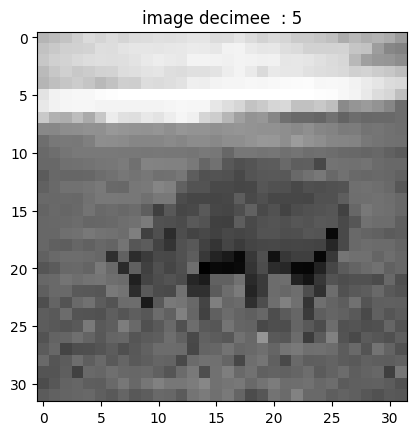

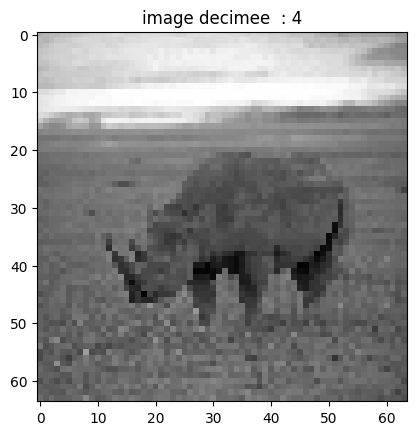

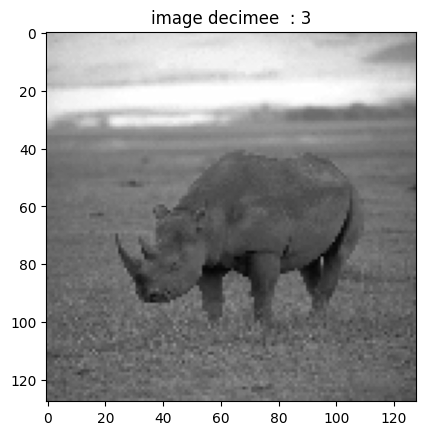

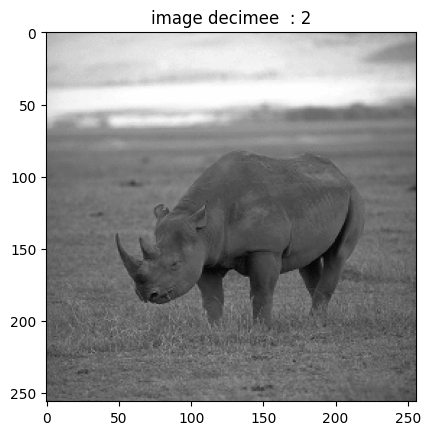

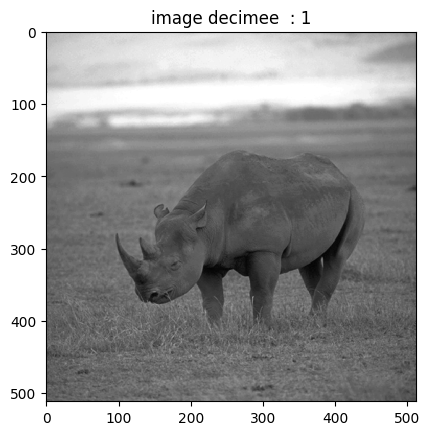

In [145]:

for n in range(N-2, -1, -1):
    plt.imshow(images_decimees[n], cmap='gray')
    plt.title('image decimee  : ' + str(n+1))
    plt.show()

In [ ]:
img_texture = 'image_texture.png'
